<a href="https://colab.research.google.com/github/rohithkodiyath/INSE6220_PCA/blob/main/INSE_6220_PCA_classification_dry_bean_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installation and setup

In [ ]:
!pip3 install pycaret==3.0.0
!pip3 install git+https://github.com/slundberg/shap.git
!pip install statsmodels --upgrade
!pip install "schemdraw<0.16"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.6/172.6 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.7/20.7 MB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 2.6 MB/s e

In [ ]:
from pycaret.utils import version
version()

'3.0.0'

## Importing Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


# Loading dataset

In [ ]:
#https://github.com/Shruti-Santoki/INSE6220_40234388/blob/main/datatest.txt
df= pd.read_csv('Dry_Bean_Dataset.csv')
df_original = df.copy();

grouped_data = df.groupby('Class').apply(lambda x: x.sample(500))
df = grouped_data.reset_index(drop=True)

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             3500 non-null   int64  
 1   Perimeter        3500 non-null   float64
 2   MajorAxisLength  3500 non-null   float64
 3   MinorAxisLength  3500 non-null   float64
 4   AspectRation     3500 non-null   float64
 5   Eccentricity     3500 non-null   float64
 6   ConvexArea       3500 non-null   int64  
 7   EquivDiameter    3500 non-null   float64
 8   Extent           3500 non-null   float64
 9   Solidity         3500 non-null   float64
 10  roundness        3500 non-null   float64
 11  Compactness      3500 non-null   float64
 12  ShapeFactor1     3500 non-null   float64
 13  ShapeFactor2     3500 non-null   float64
 14  ShapeFactor3     3500 non-null   float64
 15  ShapeFactor4     3500 non-null   float64
 16  Class            3500 non-null   object 
dtypes: float64(14)

In [ ]:
df.tail(10)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3490,43389,780.002,282.568407,195.947104,1.442065,0.720505,43940,235.041678,0.763353,0.987460,0.896186,0.831805,0.006512,0.001923,0.691899,0.997763,SIRA
3491,44152,801.564,310.120723,182.064435,1.703357,0.809532,44731,237.099288,0.702431,0.987056,0.863543,0.764539,0.007024,0.001480,0.584519,0.995645,SIRA
3492,49817,838.198,314.389617,202.597498,1.551794,0.764676,50358,251.851096,0.781382,0.989257,0.891034,0.801080,0.006311,0.001603,0.641728,0.995830,SIRA
3493,38496,727.030,268.630201,182.681765,1.470482,0.733166,38871,221.392478,0.801199,0.990353,0.915210,0.824153,0.006978,0.001986,0.679229,0.998793,SIRA
3494,45102,794.920,295.958382,195.276630,1.515585,0.751431,45790,239.636495,0.801785,0.984975,0.896931,0.809697,0.006562,0.001740,0.655609,0.993631,SIRA
3495,41713,764.602,282.482488,189.163234,1.493327,0.742681,42252,230.457461,0.806703,0.987243,0.896624,0.815829,0.006772,0.001851,0.665577,0.993924,SIRA
3496,40476,761.131,285.569127,181.608497,1.572444,0.771728,41221,227.014634,0.706338,0.981927,0.877988,0.794955,0.007055,0.001738,0.631954,0.993711,SIRA
3497,46515,815.292,298.506464,199.625206,1.495335,0.743490,47147,243.361331,0.689561,0.986595,0.879380,0.815263,0.006417,0.001749,0.664654,0.993880,SIRA
3498,44371,787.146,296.320014,191.179933,1.549954,0.764030,44868,237.686583,0.777293,0.988923,0.899909,0.802128,0.006678,0.001705,0.643409,0.997255,SIRA
3499,45083,794.349,296.577083,194.393223,1.525655,0.755233,45589,239.586015,0.819616,0.988901,0.897842,0.807837,0.006578,0.001728,0.652601,0.995644,SIRA


In [ ]:
df.shape

(3500, 17)

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             3500 non-null   int64  
 1   Perimeter        3500 non-null   float64
 2   MajorAxisLength  3500 non-null   float64
 3   MinorAxisLength  3500 non-null   float64
 4   AspectRation     3500 non-null   float64
 5   Eccentricity     3500 non-null   float64
 6   ConvexArea       3500 non-null   int64  
 7   EquivDiameter    3500 non-null   float64
 8   Extent           3500 non-null   float64
 9   Solidity         3500 non-null   float64
 10  roundness        3500 non-null   float64
 11  Compactness      3500 non-null   float64
 12  ShapeFactor1     3500 non-null   float64
 13  ShapeFactor2     3500 non-null   float64
 14  ShapeFactor3     3500 non-null   float64
 15  ShapeFactor4     3500 non-null   float64
 16  Class            3500 non-null   object 
dtypes: float64(14)

In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  3


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


# Exploratory Data Analysis





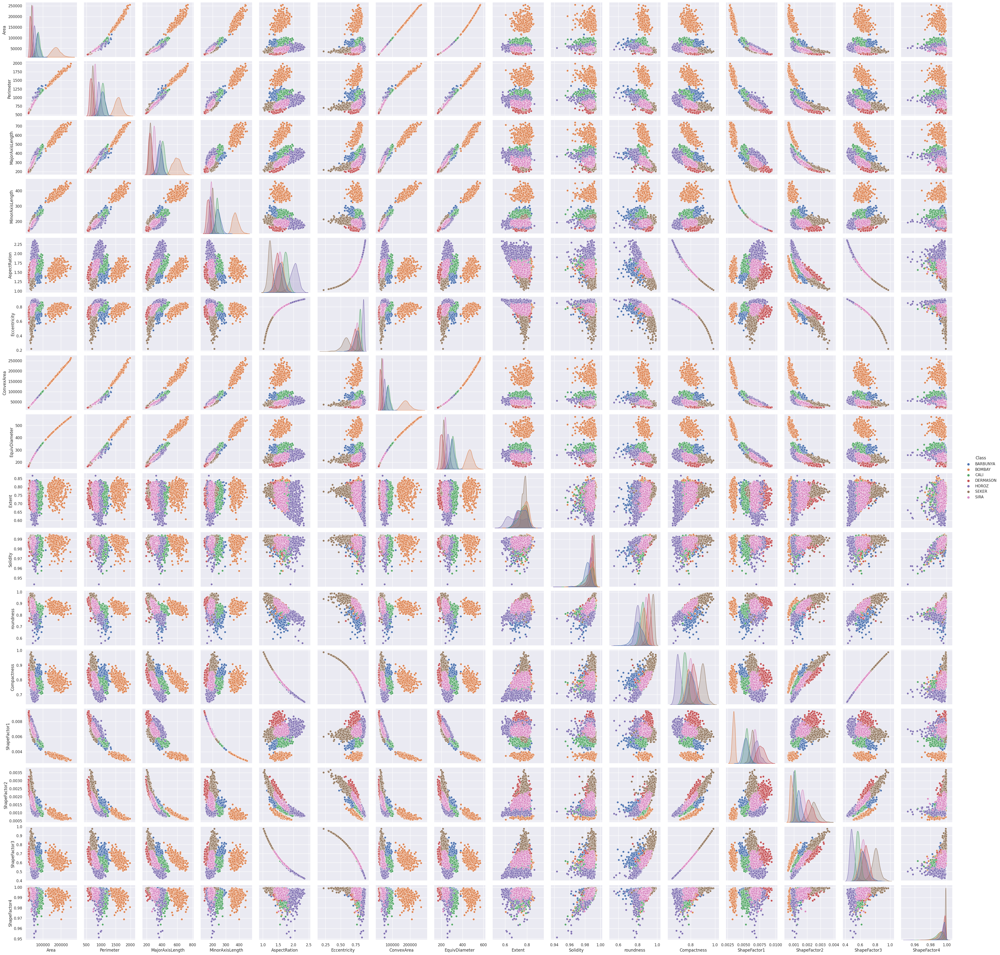

In [ ]:
sns.pairplot(df, hue='Class')
plt.show()


13611


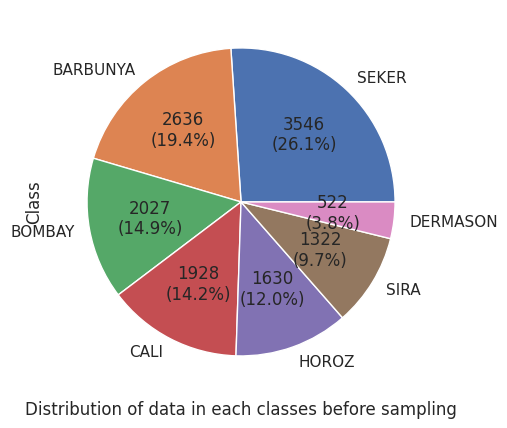

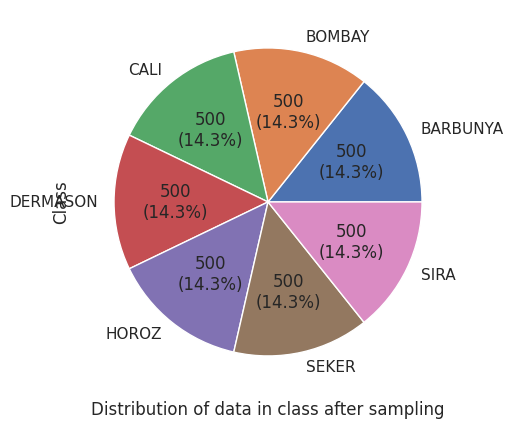

3500

In [ ]:
y_unsampled =df_original['Class']
print(y_unsampled.count())
y_unsampled.value_counts().plot(kind='pie',autopct=lambda p: '{:.0f}\n({:.1f}%)'.format(p * sum(y_unsampled.value_counts()) / 100, p), labels=y_unsampled.unique())
plt.xlabel('Distribution of data in each classes before sampling')
plt.show()

y =df['Class']
y.value_counts().plot(kind='pie',autopct=lambda p: '{:.0f}\n({:.1f}%)'.format(p * sum(y.value_counts()) / 100, p), labels=y.unique())
plt.xlabel('Distribution of data in class after sampling')
plt.show()

y.count()

**Data Matrix**

# PCA

In [ ]:
X = df.drop(columns=['Class'])
X.head(10)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,69727,1033.067,345.328328,257.839721,1.339314,0.665216,70784,297.958342,0.722822,0.985067,0.821020,0.862826,0.004953,0.001693,0.744469,0.997078
1,68109,1054.030,382.498551,227.491870,1.681372,0.803909,69487,294.481022,0.750761,0.980169,0.770386,0.769888,0.005616,0.001217,0.592727,0.996596
2,71682,1058.192,388.216736,236.420938,1.642057,0.793176,72768,302.106533,0.765392,0.985076,0.804435,0.778190,0.005416,0.001225,0.605580,0.994398
3,72779,1065.022,361.290774,258.664936,1.396752,0.698155,74246,304.409430,0.729154,0.980241,0.806304,0.842561,0.004964,0.001543,0.709909,0.991566
4,76307,1134.821,403.789912,241.441818,1.672411,0.801541,78040,311.700321,0.777342,0.977793,0.744594,0.771937,0.005292,0.001159,0.595887,0.996567
5,72044,1009.725,380.233959,242.863363,1.565629,0.769439,72712,302.868403,0.735090,0.990813,0.887976,0.796532,0.005278,0.001311,0.634463,0.993333
6,71606,1026.442,386.209879,236.771031,1.631153,0.790034,72418,301.946338,0.776166,0.988787,0.854064,0.781819,0.005394,0.001243,0.611241,0.997029
7,77147,1158.937,396.232689,248.831749,1.592372,0.778218,78916,313.411249,0.702972,0.977584,0.721787,0.790978,0.005136,0.001240,0.625646,0.996261
8,75515,1109.067,396.898514,243.924717,1.627135,0.788857,76863,310.078513,0.792351,0.982462,0.771485,0.781254,0.005256,0.001208,0.610358,0.993134
9,63653,1016.303,355.137171,228.644415,1.553229,0.765177,64755,284.684943,0.716668,0.982982,0.774430,0.801620,0.005579,0.001421,0.642594,0.998096


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,3500.0,69934.994000,46012.554081,21314.000000,40370.750000,53308.000000,75642.250000,254616.000000
Perimeter,3500.0,971.641854,296.294791,534.918000,746.003000,911.012500,1079.847500,1985.370000
MajorAxisLength,3500.0,363.308405,114.628601,191.202913,269.375892,352.065454,407.744634,738.860154
MinorAxisLength,3500.0,227.806077,66.782679,136.140637,184.470746,203.896466,242.609058,460.198497
AspectRation,3500.0,1.598704,0.245175,1.024868,1.447952,1.578152,1.727569,2.358272
Eccentricity,3500.0,0.756300,0.092525,0.218951,0.723208,0.773618,0.815435,0.905644
ConvexArea,3500.0,70912.482571,46672.164565,21587.000000,40854.750000,54177.000000,76845.750000,263261.000000
EquivDiameter,3500.0,286.054314,84.964652,164.735630,226.719287,260.526101,310.339658,569.374358
Extent,3500.0,0.752403,0.050333,0.570238,0.721579,0.763249,0.789702,0.866195
Solidity,3500.0,0.986639,0.004996,0.943559,0.984489,0.987919,0.989984,0.994677


## Standardize the Data

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,-0.004521,0.207341,-0.156877,0.449786,-1.058128,-0.984559,-0.002753,0.140126,-0.587808,-0.314732,-0.702246,1.091094,-0.770618,0.247852,1.088472,0.573376
1,-0.039690,0.278101,0.167435,-0.004706,0.337230,0.514630,-0.030547,0.099193,-0.032645,-1.295398,-1.542180,-0.417695,-0.285352,-0.520494,-0.445561,0.472384
2,0.037973,0.292150,0.217327,0.129017,0.176852,0.398615,0.039762,0.188955,0.258085,-0.313008,-0.977365,-0.282911,-0.431764,-0.507461,-0.315625,0.012123
3,0.061818,0.315205,-0.017604,0.462145,-0.823821,-0.628509,0.071434,0.216063,-0.461991,-1.280901,-0.946364,0.762098,-0.762103,0.005885,0.739083,-0.580731
4,0.138504,0.550811,0.353204,0.204210,0.300673,0.489038,0.152736,0.301886,0.495544,-1.770989,-1.970026,-0.384432,-0.522592,-0.614142,-0.413624,0.466423
5,0.045842,0.128550,0.147677,0.225499,-0.134921,0.142024,0.038562,0.197923,-0.344023,0.835613,0.408442,0.014848,-0.532721,-0.369678,-0.023637,-0.210712
6,0.036321,0.184978,0.199817,0.134260,0.132372,0.364648,0.032262,0.187069,0.472183,0.430046,-0.154106,-0.223998,-0.448060,-0.478610,-0.258393,0.563049
7,0.156762,0.632215,0.287267,0.314882,-0.025829,0.236927,0.171508,0.322026,-0.982227,-1.812967,-2.348349,-0.075316,-0.636393,-0.483274,-0.112772,0.402298
8,0.121289,0.463878,0.293076,0.241394,0.115981,0.351924,0.127514,0.282796,0.793780,-0.836256,-1.523949,-0.233176,-0.548750,-0.535454,-0.267328,-0.252361
9,-0.136547,0.150754,-0.071295,0.012555,-0.185504,0.095959,-0.131949,-0.016119,-0.710091,-0.732208,-1.475093,0.097448,-0.312204,-0.191203,0.058567,0.786552


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,3500.0,-1.624098e-16,1.000143,-1.056841,-0.642617,-0.361409,0.124055,4.014283
Perimeter,3500.0,1.299278e-16,1.000143,-1.474161,-0.761644,-0.204654,0.365248,3.421839
MajorAxisLength,3500.0,-5.846752e-16,1.000143,-1.501633,-0.819568,-0.098096,0.387709,3.276716
MinorAxisLength,3500.0,1.948917e-16,1.000143,-1.372789,-0.648993,-0.358072,0.221691,3.480328
AspectRation,3500.0,-1.867712e-16,1.000143,-2.340848,-0.614961,-0.083837,0.525679,3.098504
Eccentricity,3500.0,-6.171571e-16,1.000143,-5.808413,-0.357704,0.187199,0.639222,1.614321
ConvexArea,3500.0,3.248195e-17,1.000143,-1.057001,-0.644110,-0.358626,0.127145,4.121857
EquivDiameter,3500.0,0.000000e+00,1.000143,-1.428076,-0.698449,-0.300500,0.285870,3.335040
Extent,3500.0,-1.429206e-15,1.000143,-3.619751,-0.612501,0.215513,0.741135,2.261103
Solidity,3500.0,-1.086521e-14,1.000143,-8.624851,-0.430483,0.256156,0.669668,1.609293


**Observations and variables**

In [ ]:
observations = list(df.index)
variables = list(df.columns)

## Box and Whisker Plots

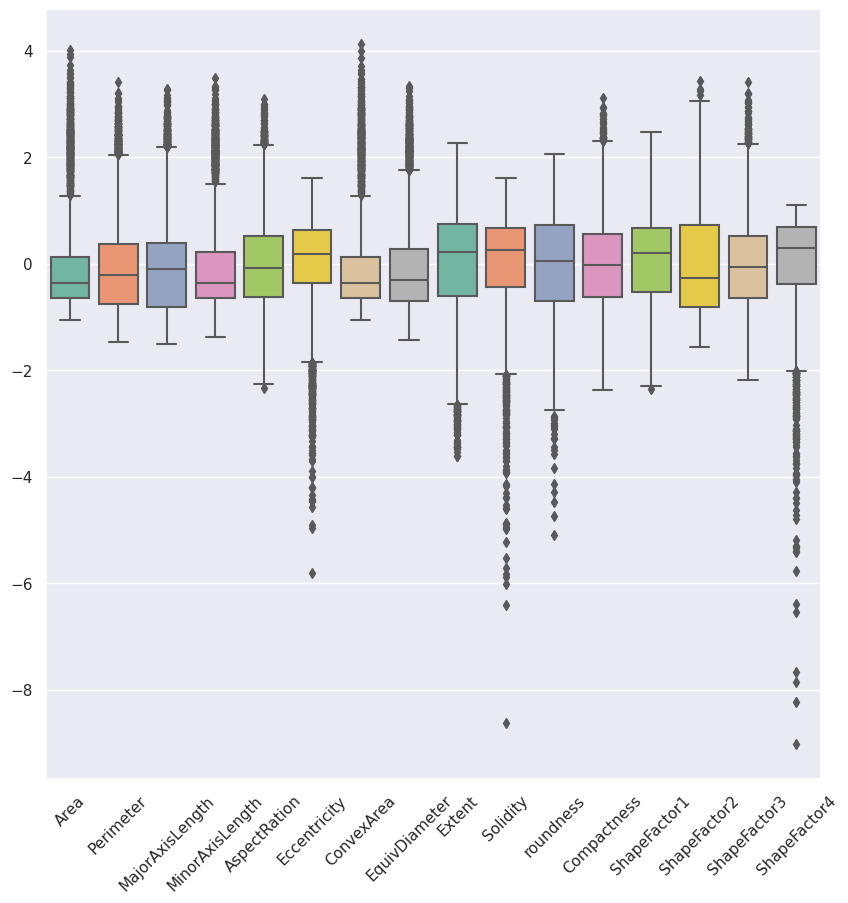

In [ ]:
ax = plt.figure(figsize=(10,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

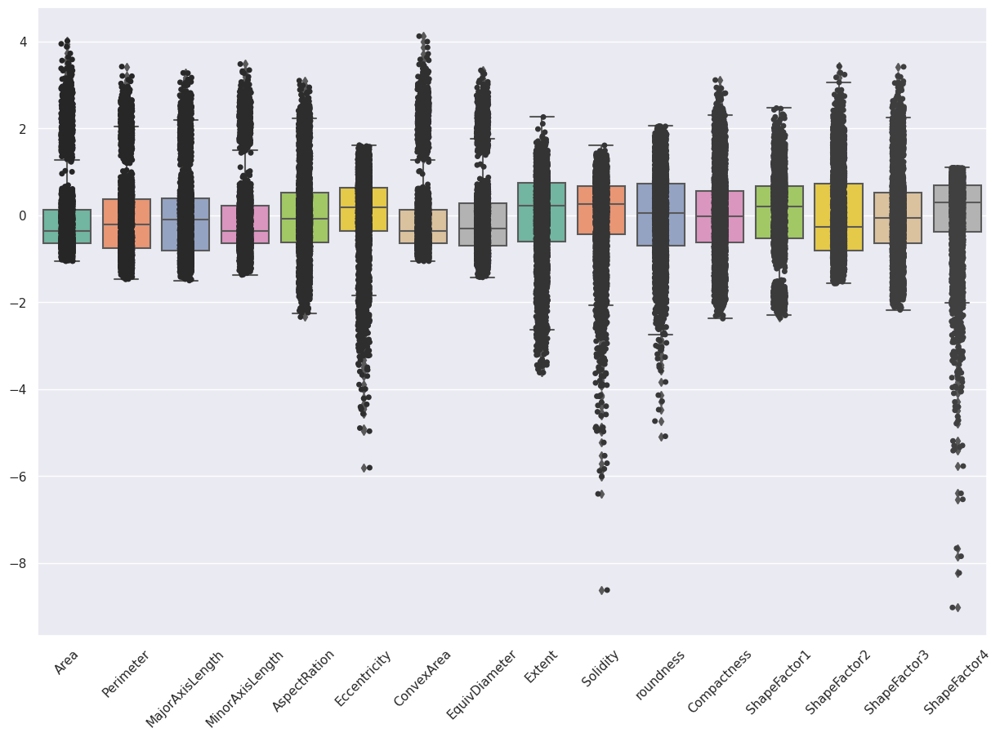

In [ ]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


## Correlation Matrix

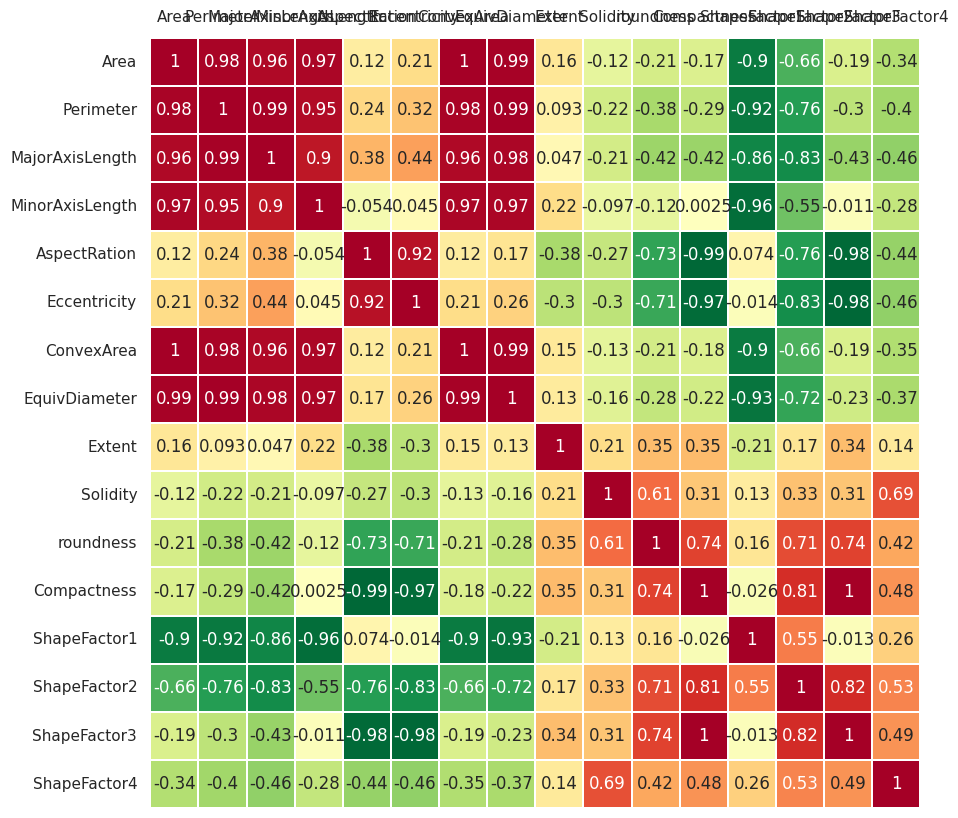

In [ ]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

## Applying PCA

In [ ]:

grouped_data = df.groupby('Class')

# Access the groups
groups = grouped_data.groups

# Display the groups
for group_name, group_indices in groups.items():
    print(f"Group: {group_name}")

Group: BARBUNYA
Group: BOMBAY
Group: CALI
Group: DERMASON
Group: HOROZ
Group: SEKER
Group: SIRA


Text(0, 0.5, 'Z_2')

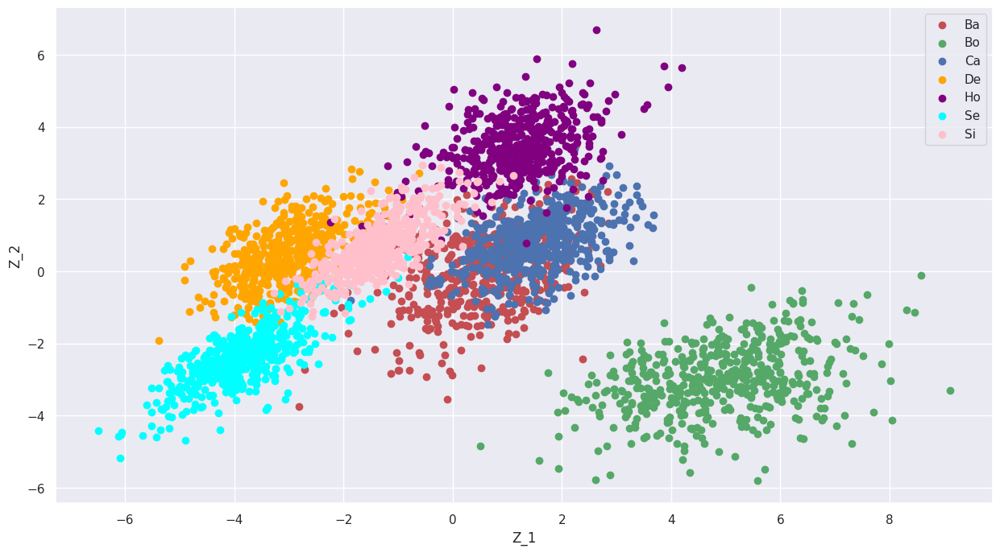

In [ ]:

pca = PCA()
Z = pca.fit_transform(X)



idx_1 = np.where(y == 'BARBUNYA')
idx_2 = np.where(y == 'BOMBAY')
idx_3 = np.where(y == 'CALI')
idx_4 = np.where(y == 'DERMASON')
idx_5 = np.where(y == 'HOROZ')
idx_6 = np.where(y == 'SEKER')
idx_7 = np.where(y == 'SIRA')





plt. figure(figsize=(15,8))
plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label='Ba')
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='g', label='Bo')
plt.scatter(Z[idx_3,0], Z[idx_3,1], c='b', label='Ca')
plt.scatter(Z[idx_4,0], Z[idx_4,1], c='orange', label='De')
plt.scatter(Z[idx_5,0], Z[idx_5,1], c='purple', label='Ho')
plt.scatter(Z[idx_6,0], Z[idx_6,1], c='cyan', label='Se')
plt.scatter(Z[idx_7,0], Z[idx_7,1], c='pink', label='Si')

plt.legend()
plt.xlabel('Z_1')
plt.ylabel('Z_2')


## Eigenvectors

[8.44284279e+00 4.69898444e+00 1.28157838e+00 7.87659391e-01
 4.92418049e-01 1.35320402e-01 1.04525709e-01 4.92263878e-02
 9.43274540e-03 1.33557487e-03 8.77104763e-04 2.32120062e-04
 1.25491078e-04 1.01840823e-05 2.24364074e-06 1.71484877e-06]



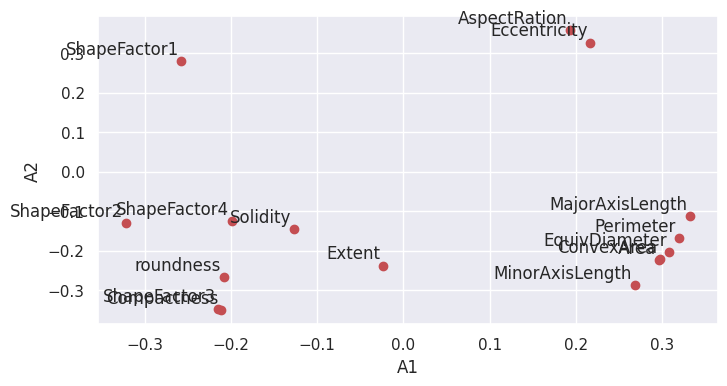

In [ ]:
print(pca.explained_variance_)
print()
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

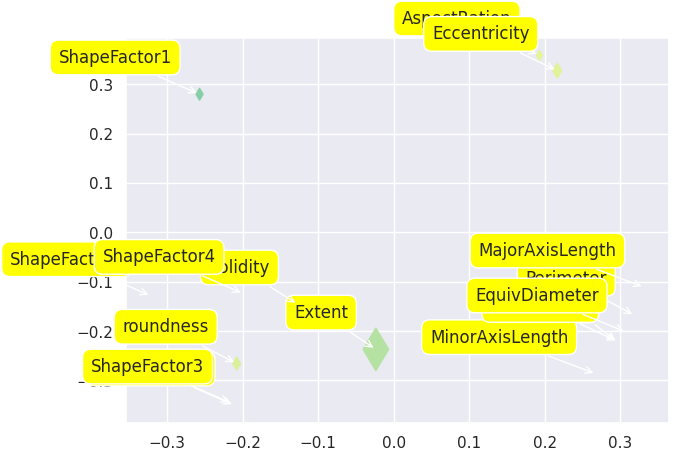

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='d', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('')
plt.ylabel('')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', ),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

## Scree plot

array([8.44284279e+00, 4.69898444e+00, 1.28157838e+00, 7.87659391e-01,
       4.92418049e-01, 1.35320402e-01, 1.04525709e-01, 4.92263878e-02,
       9.43274540e-03, 1.33557487e-03, 8.77104763e-04, 2.32120062e-04,
       1.25491078e-04, 1.01840823e-05, 2.24364074e-06, 1.71484877e-06])

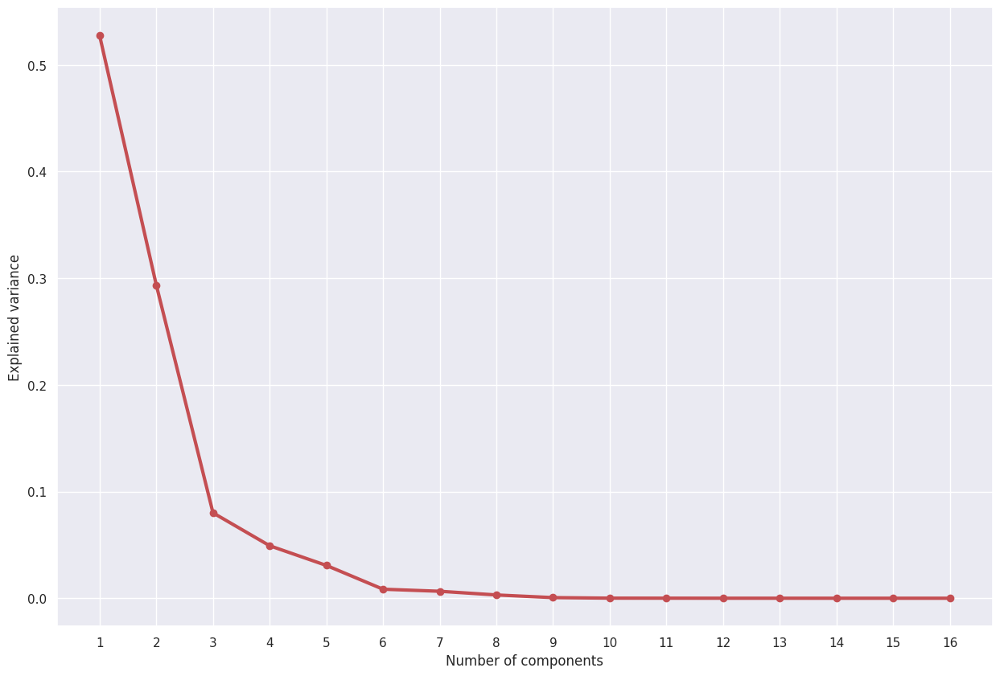

In [ ]:
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

## Explained Variance

Text(0, 0.5, 'Cumulative explained variance')

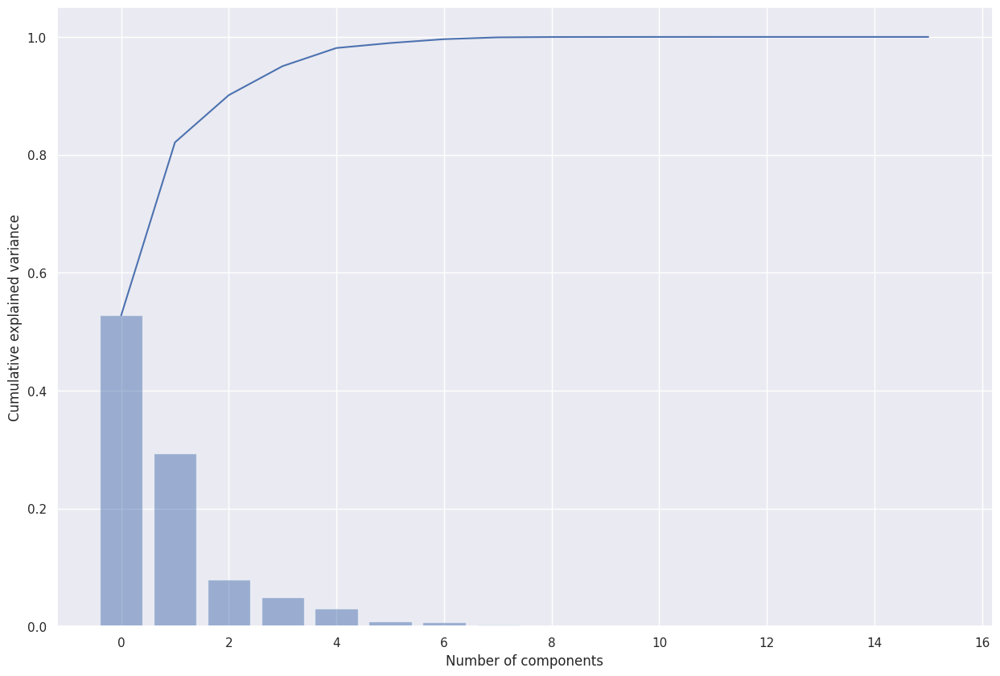

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

## Explained Variance per PC

In [ ]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}
PC_variance


{'0': 'PC 1 (52.8%)',
 '1': 'PC 2 (29.4%)',
 '2': 'PC 3 (8.0%)',
 '3': 'PC 4 (4.9%)',
 '4': 'PC 5 (3.1%)',
 '5': 'PC 6 (0.8%)',
 '6': 'PC 7 (0.7%)',
 '7': 'PC 8 (0.3%)',
 '8': 'PC 9 (0.1%)',
 '9': 'PC 10 (0.0%)',
 '10': 'PC 11 (0.0%)',
 '11': 'PC 12 (0.0%)',
 '12': 'PC 13 (0.0%)',
 '13': 'PC 14 (0.0%)',
 '14': 'PC 15 (0.0%)',
 '15': 'PC 16 (0.0%)'}

## Biplot

array([-1.58154649,  1.05666472,  0.42388366, ...,  0.47437082,
        0.26806072, -0.06578355])

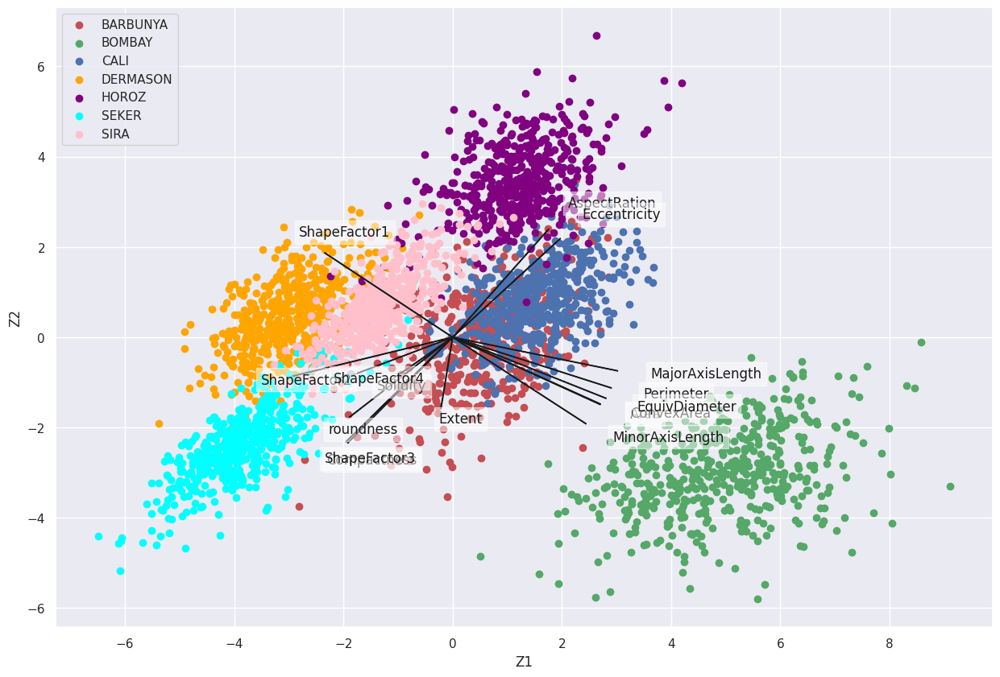

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]


plt. figure(figsize=(15,10))
plt.xlabel('Z1')
plt.ylabel('Z2')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.01, head_width=0.0025,zorder=2)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k',bbox=dict(facecolor='white', alpha=0.5),)


plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label='BARBUNYA')
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='g', label='BOMBAY')
plt.scatter(Z[idx_3,0], Z[idx_3,1], c='b', label='CALI')
plt.scatter(Z[idx_4,0], Z[idx_4,1], c='orange', label='DERMASON')
plt.scatter(Z[idx_5,0], Z[idx_5,1], c='purple', label='HOROZ')
plt.scatter(Z[idx_6,0], Z[idx_6,1], c='cyan', label='SEKER')
plt.scatter(Z[idx_7,0], Z[idx_7,1], c='pink', label='SIRA')

plt.legend(loc='upper left')
Z1
Z2

# PCA Using Library

In [ ]:
!pip install pca

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 3.1 MB/s eta 0:00:00


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [16] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [4] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [16] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


## Eigen vector

## Eigen values

##Principal Components

In [ ]:
out['PC']

,PC1,PC2,PC3,PC4
0,-0.501208,-1.581546,0.967408,-1.195401
1,1.146226,1.056665,0.621554,-0.052701
2,1.038381,0.423884,0.092335,0.228227
3,0.390804,-0.875534,2.017996,-0.630367
4,1.723780,0.768777,0.975952,0.359324
...,...,...,...,...
3495,-1.869671,0.032052,0.101624,1.176671
3496,-1.386503,1.334757,0.930471,-0.471590
3497,-1.357680,0.474371,0.489729,-1.058167
3498,-1.633624,0.268061,-0.643969,0.494939


## Scatter Plot

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '4 Principal Components explain [98.11%] of the variance'}, xlabel='PC1 (52.7% expl.var)', ylabel='PC2 (29.3% expl.var)'>)

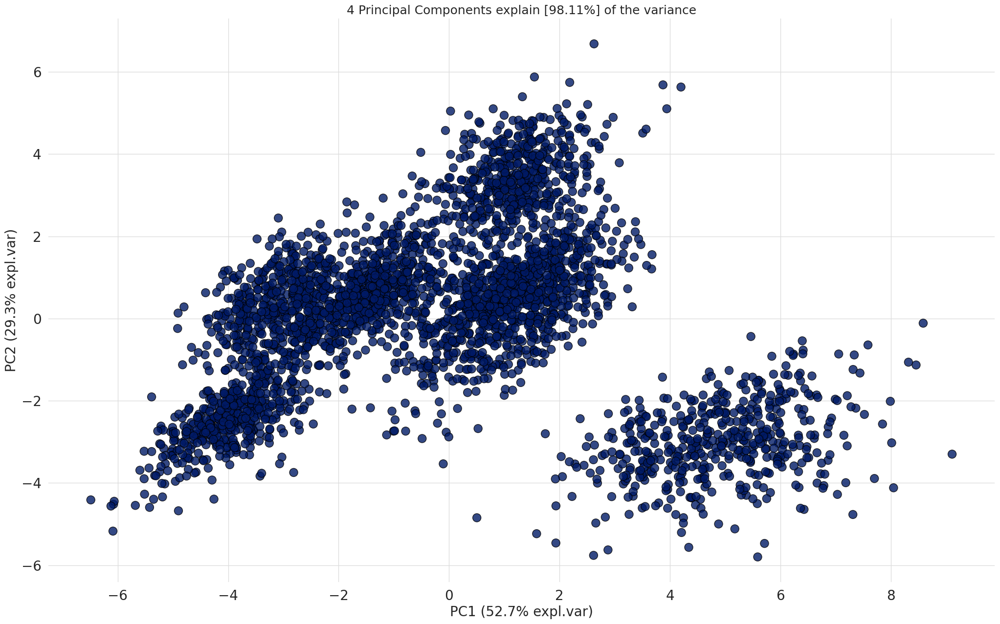

In [ ]:
model.scatter(label=True, legend=False)

## EigenVectors

In [ ]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4
Area,0.296719,-0.222842,-0.047558,-0.044762
Perimeter,0.319413,-0.168313,-0.009373,-0.054496
MajorAxisLength,0.331995,-0.111359,-0.067589,-0.023053
MinorAxisLength,0.268205,-0.286925,0.009610,-0.066887
AspectRation,0.193198,0.358641,-0.190827,0.050100
Eccentricity,0.216791,0.327481,-0.185644,0.113677
ConvexArea,0.297356,-0.221598,-0.040747,-0.043878
EquivDiameter,0.308544,-0.202487,-0.035473,-0.045398
Extent,-0.023640,-0.237123,-0.117645,0.933396
Solidity,-0.126955,-0.145714,-0.737107,-0.079077


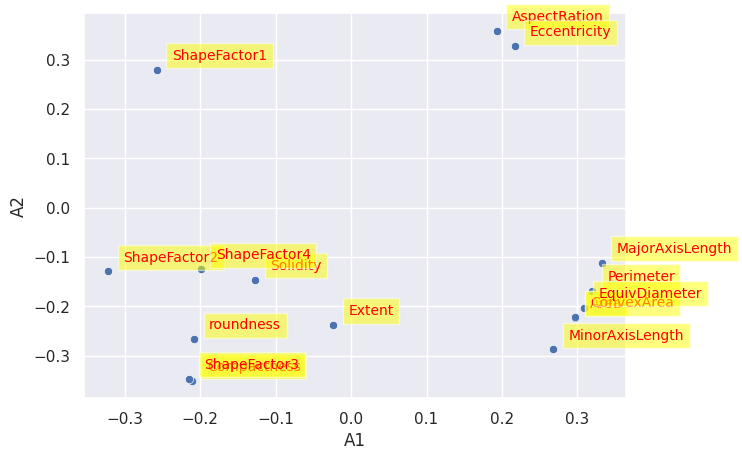

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('A1')
plt.ylabel('A2')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

## Screen Plot

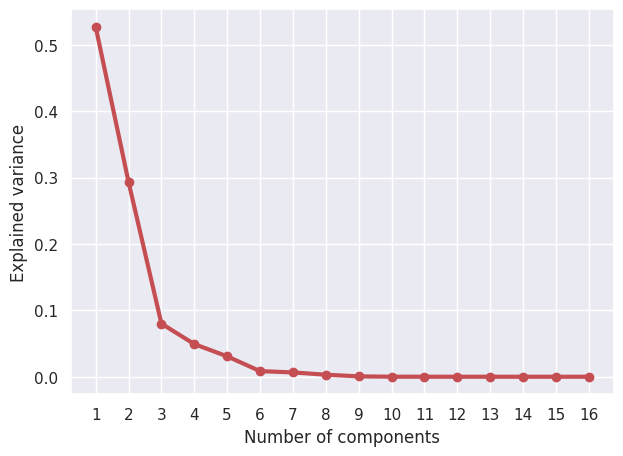

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

## Explained Variance Plot

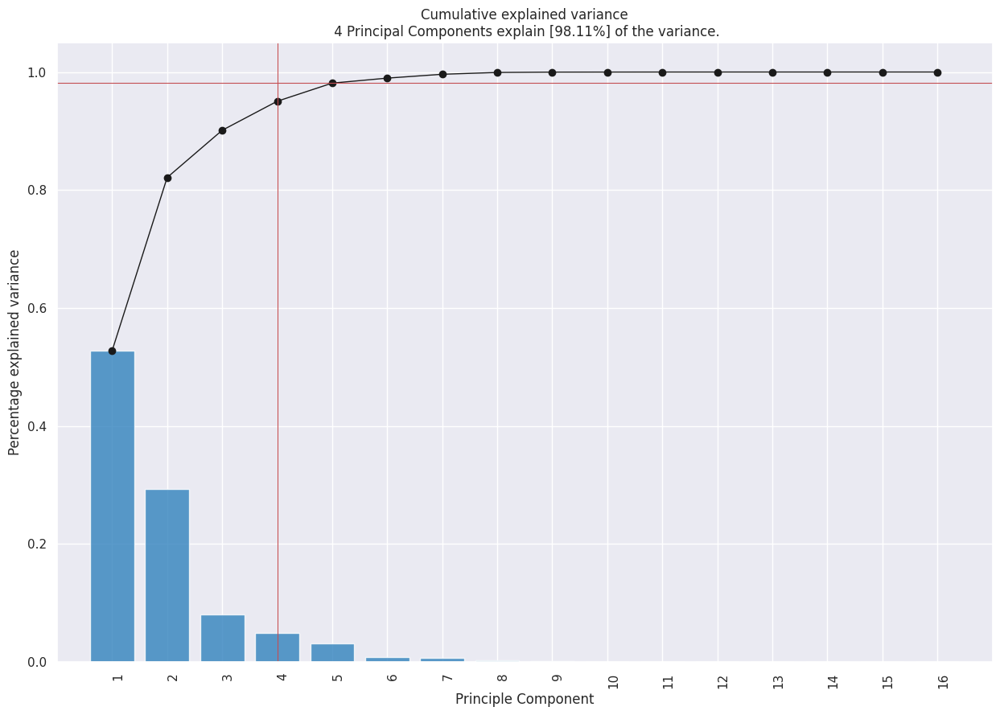

In [ ]:
model.plot();

## Biplot

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '4 Principal Components explain [98.11%] of the variance'}, xlabel='PC1 (52.7% expl.var)', ylabel='PC2 (29.3% expl.var)'>)

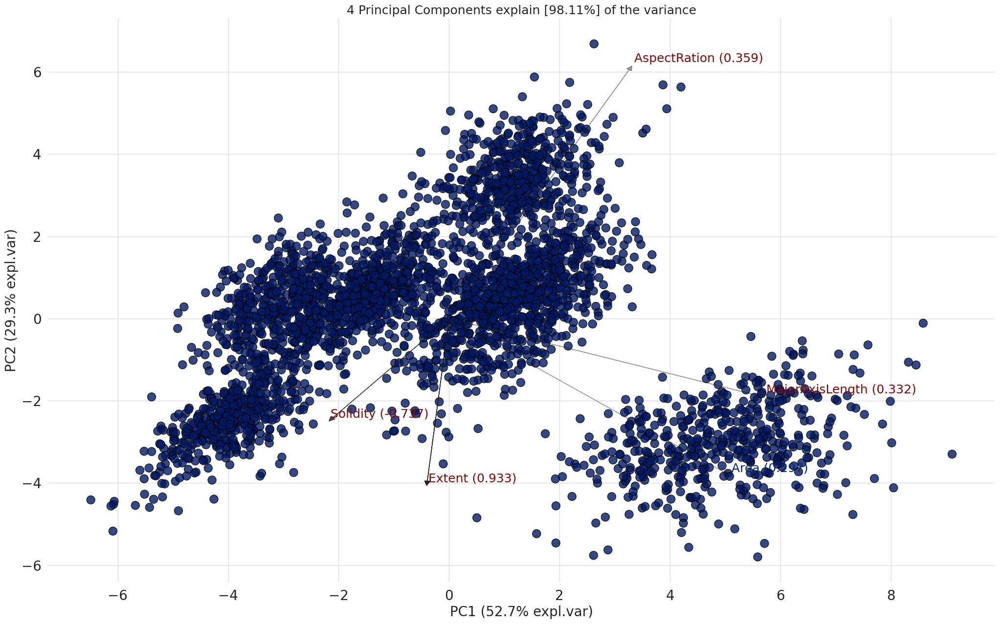

In [ ]:
model.biplot(label=True, legend=False, color_arrow='k' ,n_feat=5)

# Classification with Pycaret



In [ ]:
from pycaret.utils import version
version()


'3.0.0'

## Data Splitting



In [ ]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (3150, 17)
Unseen Data For Predictions: (350, 17)


## Setting up the Environment in PyCaret



In [ ]:
from pycaret.classification import *
clf_pca = setup(data=df, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(3500, 17)"
5,Transformed data shape,"(3500, 3)"
6,Transformed train set shape,"(2450, 3)"
7,Transformed test set shape,"(1050, 3)"
8,Numeric features,16
9,Preprocess,True


## Comparing All Models

In [ ]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8608,0.9838,0.8608,0.8626,0.8601,0.8376,0.8382,1.4450
qda,Quadratic Discriminant Analysis,0.8588,0.9845,0.8588,0.8608,0.8574,0.8352,0.8361,0.1250
lda,Linear Discriminant Analysis,0.8563,0.9833,0.8563,0.8588,0.8551,0.8324,0.8333,0.2040
gbc,Gradient Boosting Classifier,0.8449,0.9799,0.8449,0.8465,0.8442,0.8190,0.8196,3.1600
knn,K Neighbors Classifier,0.8429,0.9633,0.8429,0.8453,0.8419,0.8167,0.8174,0.4130
nb,Naive Bayes,0.8376,0.9780,0.8376,0.8390,0.8351,0.8105,0.8116,0.2660
rf,Random Forest Classifier,0.8314,0.9746,0.8314,0.8325,0.8303,0.8033,0.8039,1.1280
et,Extra Trees Classifier,0.8310,0.9747,0.8310,0.8320,0.8302,0.8029,0.8033,0.6500
lightgbm,Light Gradient Boosting Machine,0.8216,0.9772,0.8216,0.8215,0.8206,0.7919,0.7922,2.0560
xgboost,Extreme Gradient Boosting,0.8212,0.9778,0.8212,0.8230,0.8206,0.7914,0.7920,0.4120


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

Decision Tree Classifier ('dt')
K Neighbors Classifier ('knn')
Logistic Regression ('lr')
There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.




## Quadratic discriminator analysis

### Creating Model

In [ ]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8694,0.9851,0.8694,0.8688,0.8676,0.8476,0.8481
1,0.8653,0.9866,0.8653,0.8671,0.8639,0.8429,0.8436
2,0.8653,0.9843,0.8653,0.8659,0.8622,0.8429,0.8439
3,0.8408,0.9822,0.8408,0.8421,0.8408,0.8143,0.8145
4,0.8408,0.9823,0.8408,0.8458,0.8389,0.8143,0.8159
5,0.8490,0.9862,0.8490,0.8510,0.8451,0.8238,0.8257
6,0.8612,0.9829,0.8612,0.8613,0.8600,0.8381,0.8386
7,0.8735,0.9857,0.8735,0.8793,0.8736,0.8524,0.8534
8,0.8776,0.9865,0.8776,0.8817,0.8776,0.8571,0.8579


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tuning model

In [ ]:
tuned_qda = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8735,0.9842,0.8735,0.8722,0.8712,0.8524,0.8530
1,0.8490,0.9852,0.8490,0.8493,0.8473,0.8238,0.8244
2,0.8571,0.9841,0.8571,0.8572,0.8538,0.8333,0.8344
3,0.8408,0.9799,0.8408,0.8417,0.8404,0.8143,0.8146
4,0.8367,0.9804,0.8367,0.8417,0.8337,0.8095,0.8115
5,0.8449,0.9860,0.8449,0.8478,0.8391,0.8190,0.8216
6,0.8776,0.9823,0.8776,0.8780,0.8765,0.8571,0.8576
7,0.8816,0.9840,0.8816,0.8862,0.8807,0.8619,0.8631
8,0.8735,0.9872,0.8735,0.8772,0.8726,0.8524,0.8533


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluating Model

In [ ]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create K Neighbors Model

In [ ]:
knn = create_model('knn')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8653,0.9676,0.8653,0.8666,0.8639,0.8429,0.8435
1,0.8367,0.9615,0.8367,0.8363,0.8353,0.8095,0.8099
2,0.8694,0.9671,0.8694,0.8656,0.8668,0.8476,0.8479
3,0.8286,0.9563,0.8286,0.8288,0.8281,0.8000,0.8002
4,0.8000,0.9626,0.8000,0.8032,0.7996,0.7667,0.7673
5,0.8327,0.9566,0.8327,0.8381,0.8293,0.8048,0.8072
6,0.8245,0.9571,0.8245,0.8309,0.8245,0.7952,0.7962
7,0.8571,0.9693,0.8571,0.8700,0.8587,0.8333,0.8351
8,0.8612,0.9705,0.8612,0.8625,0.8615,0.8381,0.8382


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune K Neighbors Model

In [ ]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8653,0.9823,0.8653,0.8657,0.8626,0.8429,0.8439
1,0.8612,0.9855,0.8612,0.8618,0.8606,0.8381,0.8384
2,0.8653,0.9814,0.8653,0.8659,0.8622,0.8429,0.8439
3,0.8327,0.9755,0.8327,0.8324,0.8320,0.8048,0.8050
4,0.8204,0.9789,0.8204,0.8282,0.8190,0.7905,0.7924
5,0.8449,0.9832,0.8449,0.8492,0.8399,0.8190,0.8217
6,0.8612,0.9776,0.8612,0.8626,0.8611,0.8381,0.8384
7,0.8776,0.9823,0.8776,0.8833,0.8775,0.8571,0.8582
8,0.8735,0.9846,0.8735,0.8787,0.8731,0.8524,0.8534


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate K Neighbors Model

In [116]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Logistic Regression Model

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8776,0.9850,0.8776,0.8797,0.8757,0.8571,0.8582
1,0.8449,0.9862,0.8449,0.8438,0.8442,0.8190,0.8191
2,0.8653,0.9837,0.8653,0.8619,0.8630,0.8429,0.8431
3,0.8408,0.9798,0.8408,0.8411,0.8405,0.8143,0.8144
4,0.8286,0.9815,0.8286,0.8378,0.8296,0.8000,0.8013
5,0.8694,0.9867,0.8694,0.8733,0.8669,0.8476,0.8492
6,0.8531,0.9828,0.8531,0.8531,0.8527,0.8286,0.8287
7,0.8776,0.9838,0.8776,0.8827,0.8775,0.8571,0.8581
8,0.8980,0.9859,0.8980,0.8991,0.8978,0.8810,0.8812


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Tune Logistic Regression Model

In [ ]:
tuned_lr = tune_model(lr)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8735,0.9851,0.8735,0.8746,0.8717,0.8524,0.8532
1,0.8531,0.9862,0.8531,0.8524,0.8526,0.8286,0.8286
2,0.8612,0.9838,0.8612,0.8578,0.8591,0.8381,0.8382
3,0.8408,0.9801,0.8408,0.8411,0.8405,0.8143,0.8144
4,0.8367,0.9813,0.8367,0.8445,0.8379,0.8095,0.8105
5,0.8694,0.9869,0.8694,0.8733,0.8669,0.8476,0.8492
6,0.8531,0.9827,0.8531,0.8531,0.8527,0.8286,0.8287
7,0.8816,0.9840,0.8816,0.8875,0.8819,0.8619,0.8629
8,0.8980,0.9859,0.8980,0.8991,0.8978,0.8810,0.8812


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Logistic Regression Model

In [ ]:
tuned_lr

LogisticRegression(C=2.833, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Random Forest Model

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8490,0.9777,0.8490,0.8500,0.8474,0.8238,0.8245
1,0.8000,0.9777,0.8000,0.8009,0.7997,0.7667,0.7669
2,0.8694,0.9782,0.8694,0.8659,0.8671,0.8476,0.8478
3,0.8163,0.9674,0.8163,0.8167,0.8162,0.7857,0.7858
4,0.7878,0.9710,0.7878,0.7917,0.7871,0.7524,0.7532
5,0.8327,0.9729,0.8327,0.8351,0.8289,0.8048,0.8068
6,0.8286,0.9705,0.8286,0.8287,0.8275,0.8000,0.8003
7,0.8327,0.9773,0.8327,0.8386,0.8324,0.8048,0.8058
8,0.8816,0.9798,0.8816,0.8827,0.8817,0.8619,0.8621


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune Random Forest Model

In [ ]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8653,0.9738,0.8653,0.8656,0.8638,0.8429,0.8434
1,0.8776,0.9729,0.8776,0.8772,0.8772,0.8571,0.8572
2,0.8571,0.9703,0.8571,0.8565,0.8553,0.8333,0.8339
3,0.8367,0.9661,0.8367,0.8377,0.8363,0.8095,0.8098
4,0.7878,0.9633,0.7878,0.7996,0.7885,0.7524,0.7544
5,0.8531,0.9769,0.8531,0.8575,0.8522,0.8286,0.8297
6,0.8449,0.9737,0.8449,0.8488,0.8451,0.8190,0.8197
7,0.8449,0.9778,0.8449,0.8595,0.8465,0.8190,0.8209
8,0.8694,0.9788,0.8694,0.8795,0.8717,0.8476,0.8486


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Random Forest Model

In [119]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create the Best Model

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8735,0.9851,0.8735,0.8746,0.8717,0.8524,0.8532
1,0.8531,0.9862,0.8531,0.8524,0.8526,0.8286,0.8286
2,0.8612,0.9838,0.8612,0.8578,0.8591,0.8381,0.8382
3,0.8408,0.9801,0.8408,0.8411,0.8405,0.8143,0.8144
4,0.8367,0.9813,0.8367,0.8445,0.8379,0.8095,0.8105
5,0.8694,0.9869,0.8694,0.8733,0.8669,0.8476,0.8492
6,0.8531,0.9827,0.8531,0.8531,0.8527,0.8286,0.8287
7,0.8816,0.9840,0.8816,0.8875,0.8819,0.8619,0.8629
8,0.8980,0.9859,0.8980,0.8991,0.8978,0.8810,0.8812


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_best_model


LogisticRegression(C=2.833, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Evaluate the Best Model

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.



In [ ]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Classification + PCA**

In [ ]:
clf_pca = setup(data=df, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 4)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(3500, 17)"
5,Transformed data shape,"(3500, 5)"
6,Transformed train set shape,"(2450, 5)"
7,Transformed test set shape,"(1050, 5)"
8,Numeric features,16
9,Preprocess,True


In [ ]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.8894,0.9897,0.8894,0.8914,0.8892,0.8710,0.8714,0.7790
lr,Logistic Regression,0.8873,0.9902,0.8873,0.8895,0.8869,0.8686,0.8691,1.3560
gbc,Gradient Boosting Classifier,0.8845,0.9877,0.8845,0.8872,0.8846,0.8652,0.8657,7.2470
et,Extra Trees Classifier,0.8845,0.9888,0.8845,0.8872,0.8840,0.8652,0.8659,1.0790
lda,Linear Discriminant Analysis,0.8829,0.9890,0.8829,0.8874,0.8826,0.8633,0.8642,0.3020
rf,Random Forest Classifier,0.8824,0.9867,0.8824,0.8867,0.8825,0.8629,0.8636,2.5540
xgboost,Extreme Gradient Boosting,0.8812,0.9870,0.8812,0.8844,0.8814,0.8614,0.8619,0.7990
lightgbm,Light Gradient Boosting Machine,0.8776,0.9864,0.8776,0.8806,0.8777,0.8571,0.8576,6.4050
knn,K Neighbors Classifier,0.8751,0.9759,0.8751,0.8778,0.8749,0.8543,0.8548,0.9730
nb,Naive Bayes,0.8551,0.9824,0.8551,0.8573,0.8540,0.8310,0.8317,0.5140


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

## Logistic regression

### Create Model

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9265,0.9937,0.9265,0.9270,0.9260,0.9143,0.9146
1,0.8939,0.9889,0.8939,0.8951,0.8932,0.8762,0.8766
2,0.8571,0.9897,0.8571,0.8557,0.8547,0.8333,0.8339
3,0.8612,0.9883,0.8612,0.8635,0.8611,0.8381,0.8385
4,0.8531,0.9882,0.8531,0.8613,0.8529,0.8286,0.8301
5,0.9061,0.9914,0.9061,0.9088,0.9059,0.8905,0.8910
6,0.8939,0.9916,0.8939,0.8954,0.8939,0.8762,0.8765
7,0.8898,0.9907,0.8898,0.8936,0.8893,0.8714,0.8723
8,0.8939,0.9874,0.8939,0.8960,0.8945,0.8762,0.8764


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune model

In [ ]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9224,0.9933,0.9224,0.9231,0.9217,0.9095,0.9099
1,0.8898,0.9879,0.8898,0.8919,0.8890,0.8714,0.8720
2,0.8653,0.9886,0.8653,0.8643,0.8635,0.8429,0.8433
3,0.8653,0.9865,0.8653,0.8674,0.8652,0.8429,0.8432
4,0.8571,0.9859,0.8571,0.8639,0.8565,0.8333,0.8347
5,0.8898,0.9896,0.8898,0.8918,0.8896,0.8714,0.8719
6,0.8980,0.9904,0.8980,0.9002,0.8984,0.8810,0.8812
7,0.8980,0.9896,0.8980,0.9023,0.8972,0.8810,0.8820
8,0.8857,0.9874,0.8857,0.8878,0.8862,0.8667,0.8669


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Model

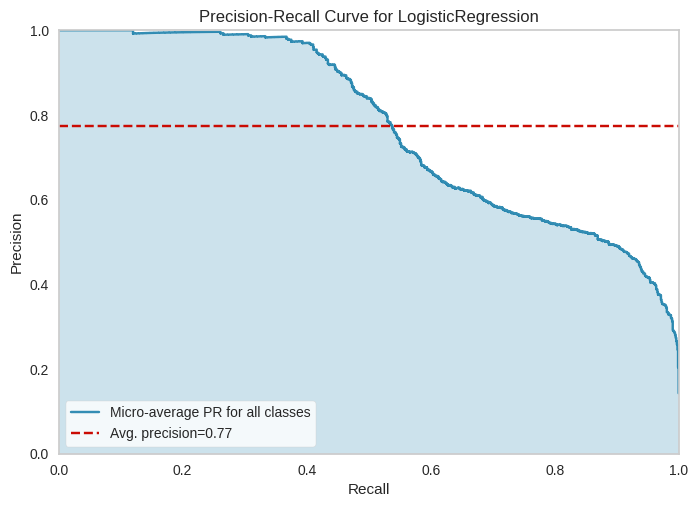

In [ ]:
evaluate_model(tuned_lr)

## Duadratic descriminant Analysis

### Create Model

In [ ]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9265,0.9943,0.9265,0.9269,0.9260,0.9143,0.9145
1,0.8816,0.9862,0.8816,0.8814,0.8809,0.8619,0.8621
2,0.8776,0.9881,0.8776,0.8784,0.8755,0.8571,0.8580
3,0.8612,0.9879,0.8612,0.8622,0.8616,0.8381,0.8381
4,0.8694,0.9858,0.8694,0.8742,0.8695,0.8476,0.8484
5,0.9020,0.9914,0.9020,0.9052,0.9018,0.8857,0.8864
6,0.8776,0.9903,0.8776,0.8807,0.8778,0.8571,0.8576
7,0.9102,0.9907,0.9102,0.9134,0.9098,0.8952,0.8960
8,0.8816,0.9894,0.8816,0.8849,0.8828,0.8619,0.8621


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune Model

In [ ]:
tuned_qda = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9224,0.9937,0.9224,0.9226,0.9215,0.9095,0.9099
1,0.8857,0.9859,0.8857,0.8859,0.8844,0.8667,0.8671
2,0.8694,0.9881,0.8694,0.8697,0.8670,0.8476,0.8485
3,0.8531,0.9872,0.8531,0.8540,0.8531,0.8286,0.8287
4,0.8816,0.9854,0.8816,0.8866,0.8802,0.8619,0.8632
5,0.8898,0.9909,0.8898,0.8962,0.8884,0.8714,0.8729
6,0.8735,0.9899,0.8735,0.8752,0.8734,0.8524,0.8528
7,0.8939,0.9896,0.8939,0.8988,0.8926,0.8762,0.8775
8,0.8776,0.9903,0.8776,0.8804,0.8787,0.8571,0.8572


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


### Evaluate Model

In [ ]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## K Neighbors Model

### Create Model

In [ ]:
knn = create_model("knn")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8980,0.9809,0.8980,0.9012,0.8974,0.8810,0.8817
1,0.8776,0.9780,0.8776,0.8781,0.8774,0.8571,0.8573
2,0.8735,0.9743,0.8735,0.8741,0.8733,0.8524,0.8526
3,0.8490,0.9721,0.8490,0.8503,0.8492,0.8238,0.8240
4,0.8490,0.9682,0.8490,0.8525,0.8486,0.8238,0.8246
5,0.8857,0.9723,0.8857,0.8925,0.8854,0.8667,0.8679
6,0.8776,0.9756,0.8776,0.8786,0.8773,0.8571,0.8574
7,0.8735,0.9862,0.8735,0.8793,0.8723,0.8524,0.8538
8,0.8653,0.9735,0.8653,0.8687,0.8665,0.8429,0.8430


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

### Tune Model

In [ ]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9143,0.9932,0.9143,0.9150,0.9139,0.9000,0.9002
1,0.8857,0.9867,0.8857,0.8864,0.8858,0.8667,0.8668
2,0.8898,0.9872,0.8898,0.8906,0.8881,0.8714,0.8721
3,0.8776,0.9829,0.8776,0.8782,0.8777,0.8571,0.8572
4,0.8490,0.9822,0.8490,0.8561,0.8496,0.8238,0.8249
5,0.8939,0.9875,0.8939,0.9010,0.8924,0.8762,0.8778
6,0.8939,0.9857,0.8939,0.8978,0.8942,0.8762,0.8768
7,0.8939,0.9926,0.8939,0.9017,0.8927,0.8762,0.8778
8,0.8694,0.9816,0.8694,0.8725,0.8706,0.8476,0.8477


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


### Evaluate Model

In [ ]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Tune the Best Model

In [ ]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9224,0.9937,0.9224,0.9226,0.9215,0.9095,0.9099
1,0.8857,0.9859,0.8857,0.8859,0.8844,0.8667,0.8671
2,0.8694,0.9881,0.8694,0.8697,0.8670,0.8476,0.8485
3,0.8531,0.9872,0.8531,0.8540,0.8531,0.8286,0.8287
4,0.8816,0.9854,0.8816,0.8866,0.8802,0.8619,0.8632
5,0.8898,0.9909,0.8898,0.8962,0.8884,0.8714,0.8729
6,0.8735,0.9899,0.8735,0.8752,0.8734,0.8524,0.8528
7,0.8939,0.9896,0.8939,0.8988,0.8926,0.8762,0.8775
8,0.8776,0.9903,0.8776,0.8804,0.8787,0.8571,0.8572


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
tuned_best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

### Evaluate the Best Model


In [ ]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Explainable AI with Shapley values

Shapley values are a concept from cooperative game theory that has been adapted for use in machine learning and AI explainability. They provide a way to attribute a contribution or importance value to each feature or factor that influences the outcome of a prediction or decision made by an AI model

SHAP is a popular Python library for implementing Shapley value-based explanations for machine learning models. It provides tools and methods to explain the output of machine learning models by attributing the contributions of individual features to each prediction.

In [ ]:
!pip3 install shap

In [ ]:
import shap

In [111]:
lr_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9265,0.9940,0.9265,0.9274,0.9265,0.9143,0.9144
1,0.8898,0.9872,0.8898,0.8900,0.8898,0.8714,0.8715
2,0.8816,0.9883,0.8816,0.8792,0.8797,0.8619,0.8622
3,0.8694,0.9853,0.8694,0.8713,0.8691,0.8476,0.8480
4,0.8571,0.9850,0.8571,0.8640,0.8576,0.8333,0.8345
5,0.8776,0.9891,0.8776,0.8876,0.8751,0.8571,0.8596
6,0.8735,0.9868,0.8735,0.8754,0.8729,0.8524,0.8529
7,0.8980,0.9908,0.8980,0.9038,0.8978,0.8810,0.8821
8,0.8816,0.9888,0.8816,0.8832,0.8820,0.8619,0.8621


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [112]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8898,0.9902,0.8898,0.8895,0.8883,0.8714,0.8719
1,0.8612,0.9854,0.8612,0.8598,0.8596,0.8381,0.8384
2,0.8571,0.9871,0.8571,0.8578,0.8540,0.8333,0.8346
3,0.8449,0.9823,0.8449,0.8468,0.8447,0.8190,0.8195
4,0.8449,0.9821,0.8449,0.8511,0.8411,0.8190,0.8212
5,0.8939,0.9882,0.8939,0.8997,0.8935,0.8762,0.8773
6,0.8694,0.9861,0.8694,0.8717,0.8690,0.8476,0.8481
7,0.8776,0.9879,0.8776,0.8848,0.8776,0.8571,0.8584
8,0.8898,0.9894,0.8898,0.8923,0.8907,0.8714,0.8715


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


## **SHAP Summary Plot**

Instead of employing a conventional feature importance bar chart, we opt for a density scatter plot of SHAP values for each feature. This approach helps us assess the extent to which each feature influences the model's output for individual data points within the validation dataset

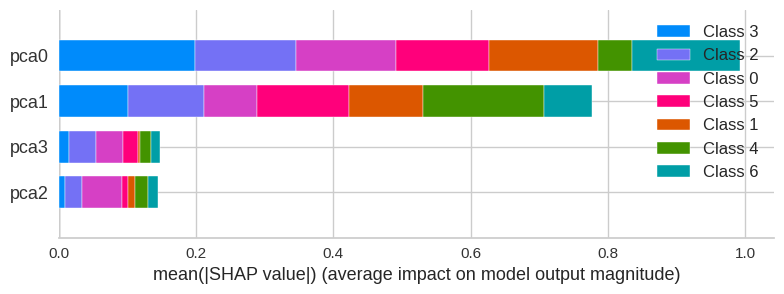

In [113]:

interpret_model(tuned_lr_pca, plot='summary')

**Visualize a single prediction**

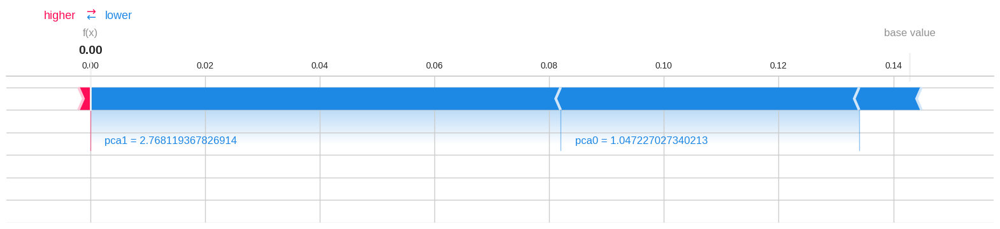

In [114]:
shap.initjs()
interpret_model(tuned_lr_pca, plot='reason', observation=32,matplotlib = True)

**Visualize many predictions**

In [115]:
interpret_model(tuned_lr_pca, plot='reason')